<a href="https://colab.research.google.com/github/Aakash1095/Regression-Capstone-project/blob/main/Copy_of_Copy_of_Bike_Sharing_Demand_Prediction_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Seoul Bike Sharing Demand Prediction </u></b>

## <b> Problem Description </b>

### Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.


## <b> Data Description </b>

### <b> The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.</b>


### <b>Attribute Information: </b>

* ### Date : year-month-day
* ### Rented Bike count - Count of bikes rented at each hour
* ### Hour - Hour of he day
* ### Temperature-Temperature in Celsius
* ### Humidity - %
* ### Windspeed - m/s
* ### Visibility - 10m
* ### Dew point temperature - Celsius
* ### Solar radiation - MJ/m2
* ### Rainfall - mm
* ### Snowfall - cm
* ### Seasons - Winter, Spring, Summer, Autumn
* ### Holiday - Holiday/No holiday
* ### Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)

In [ ]:
import pandas as pd 
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df=pd.read_csv('/content/drive/MyDrive/All_data_files_Almabetter/SeoulBikeData.csv',encoding= 'unicode_escape')
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [ ]:
df.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


In [ ]:
df.shape

(8760, 14)

# **Exploring df usinng pandas profiling** ▶

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 21.8 MB 70 kB/s
     |████████████████████████████████| 11.1 MB 8.6 MB/s 
     |████████████████████████████████| 596 kB 55.0 MB/s 
     |████████████████████████████████| 102 kB 70.4 MB/s 
     |████████████████████████████████| 690 kB 44.0 MB/s 
     |████████████████████████████████| 4.7 MB 28.3 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 812 kB 43.6 MB/s 
     |████████████████████████████████| 38.1 MB 1.3 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=262599 sha256=90a38c2fd284ff6afdd8ac9cd5a62125cc023c0c31d3f52622bda16caf360d4b
  Stored in directory: /tmp/pip-ephem-wheel-cache-70kxuyln/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=e9bd62eb4290fb98bcab80bc918

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
# If code not run install following
#!pip install pyyaml==5.4.1

In [ ]:
profile = ProfileReport(df, title=' Bike Sharing Demand Prediction', html={'style':{'full_width':True}})

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file('/content/drive/MyDrive/Bike Sharing Demand Prediction.html')


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]



---



---



---



---



# **Exploring Data using Sweeetviz library**

In [ ]:
!pip install sweetviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 7.4 MB/s 


In [ ]:
import sweetviz 

In [ ]:
my_report = sweetviz.analyze([df, "df"],target_feat='Rented Bike Count')

                                             |          | [  0%]   00:00 -> (? left)

In [ ]:
my_report.show_html('Report.html')

Report Report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



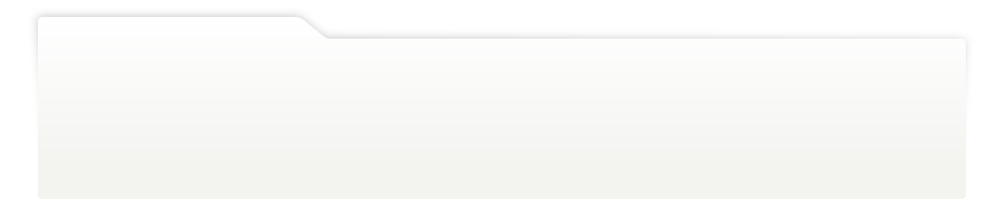
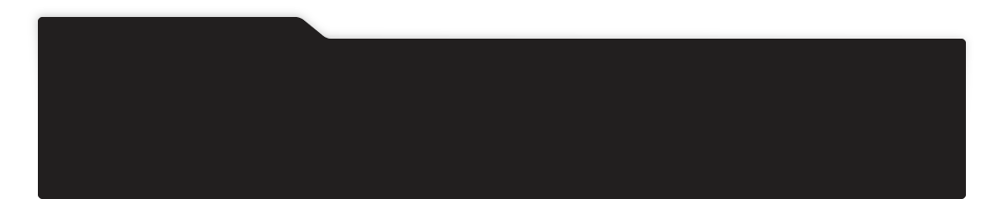
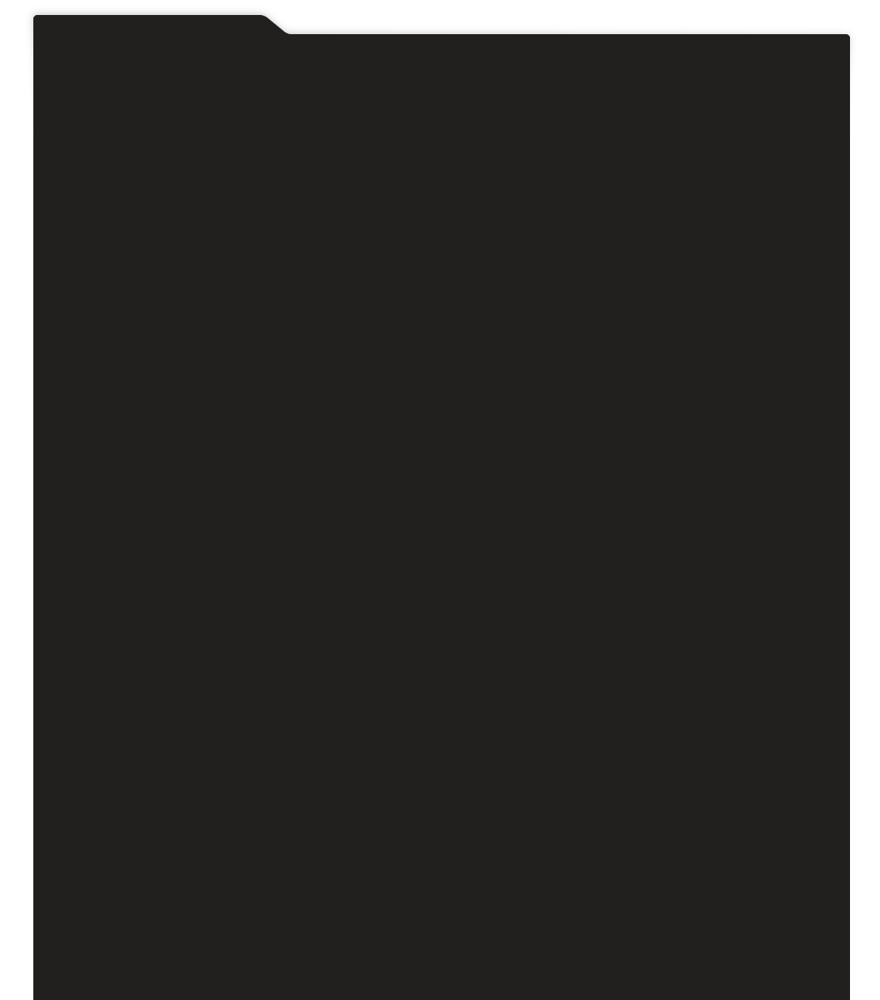
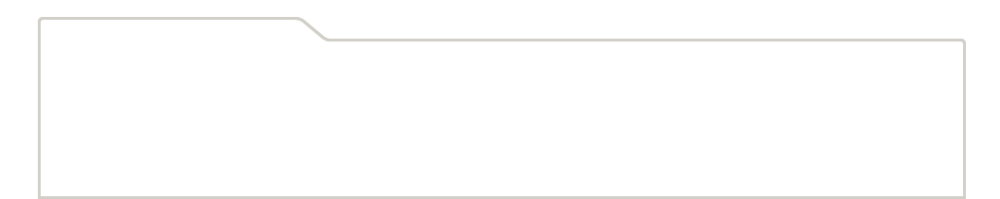
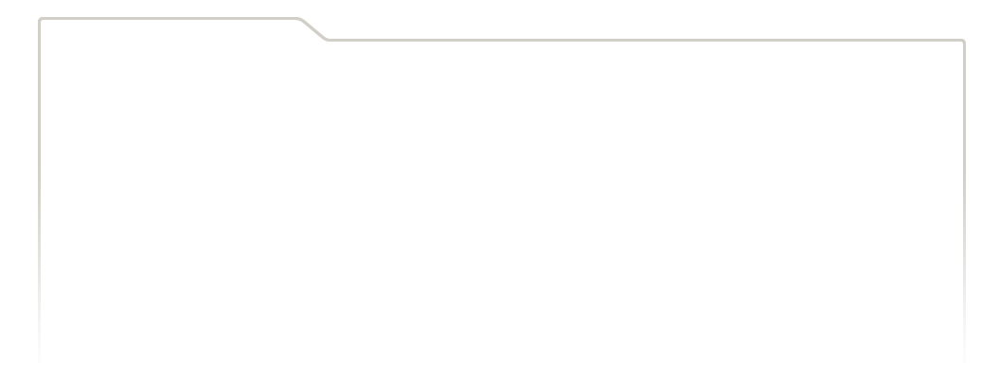
...
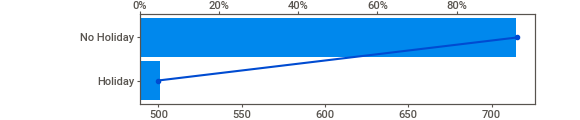
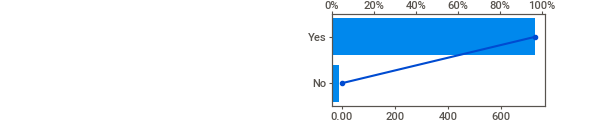
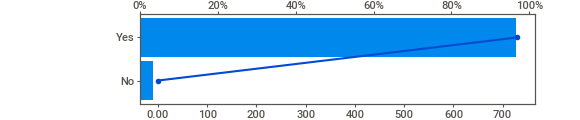
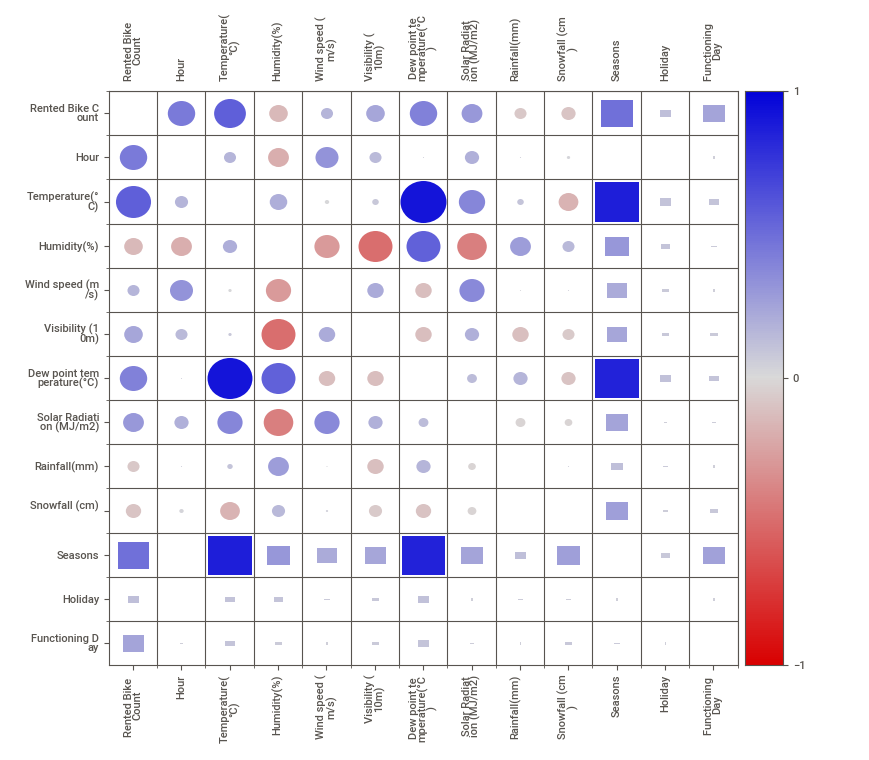
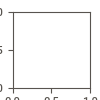

In [ ]:
import IPython
IPython.display.HTML('Report.html')



---



---



---



# EDA continue

In [ ]:
df.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#Expanding date variable

In [ ]:
df['date_column'] = pd.to_datetime(df['Date'])

In [ ]:
df['Dates'] = df['date_column'].dt.date

In [ ]:
df['Month'] = pd.DatetimeIndex(df['date_column']).month

In [ ]:
df['Year'] = pd.DatetimeIndex(df['date_column']).year

In [ ]:
df['day'] = df.date_column.dt.day

In [ ]:
df['weekday']=df.date_column.dt.weekday

In [ ]:
df['weekday'].unique()

array([3, 6, 2, 4, 0, 5, 1])

In [ ]:
df['day_of_week'] = df['date_column'].dt.day_name()

In [ ]:
df.head(1)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),...,Seasons,Holiday,Functioning Day,date_column,Dates,Month,Year,day,weekday,day_of_week
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,...,Winter,No Holiday,Yes,2017-01-12,2017-01-12,1,2017,12,3,Thursday


In [ ]:
df= df.drop(['Date','Dates','date_column','weekday'], axis=1)

In [ ]:
df.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


# **Checking outliers**

In [ ]:
import seaborn as sns

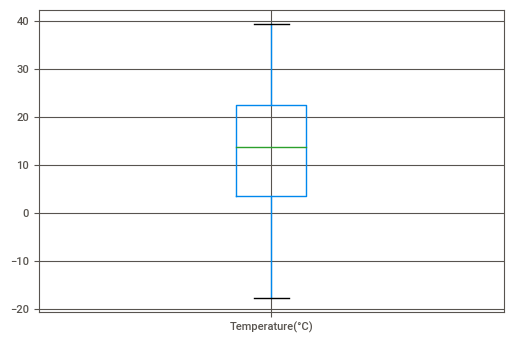

In [ ]:
df.boxplot(column=['Temperature(°C)',])

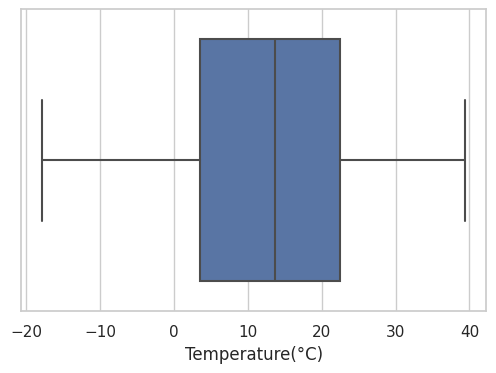

In [ ]:

sns.set_theme(style="whitegrid")
ax = sns.boxplot(x=df["Temperature(°C)"])


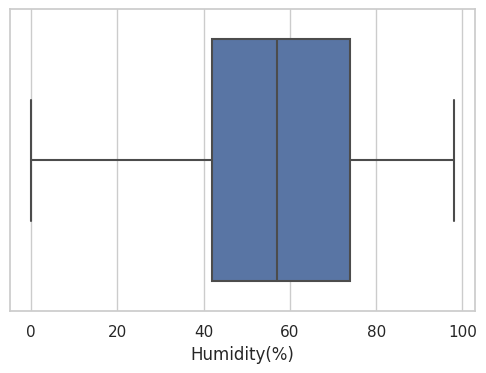

In [ ]:
ax = sns.boxplot(x=df["Humidity(%)"])

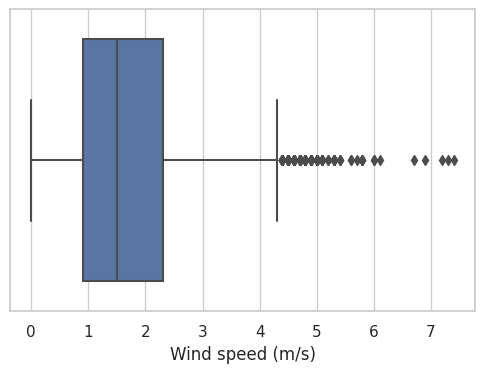

In [ ]:
ax = sns.boxplot(x=df["Wind speed (m/s)"])

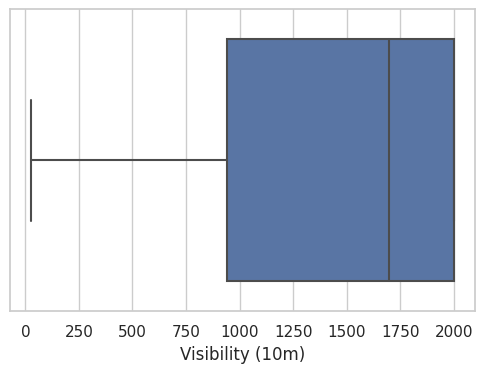

In [ ]:
ax = sns.boxplot(x=df["Visibility (10m)"])

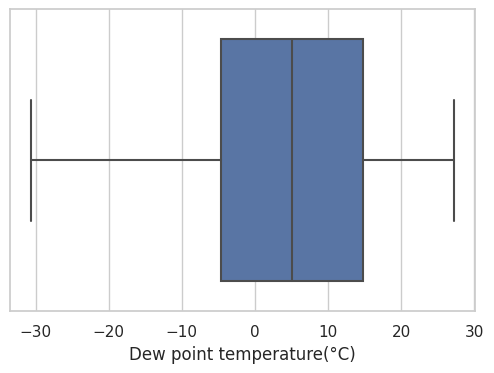

In [ ]:
ax = sns.boxplot(x=df["Dew point temperature(°C)"])

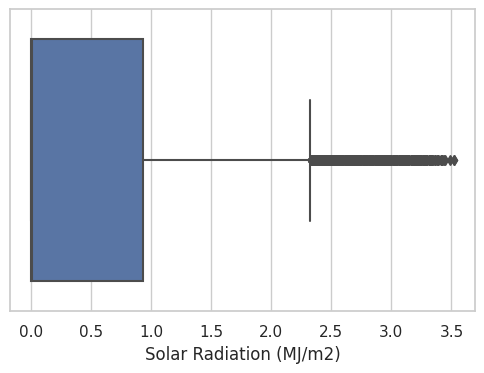

In [ ]:
ax = sns.boxplot(x=df["Solar Radiation (MJ/m2)"])	

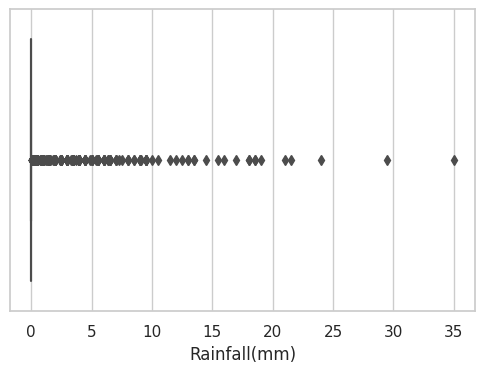

In [ ]:
ax= sns.boxplot(x=df["Rainfall(mm)"])	

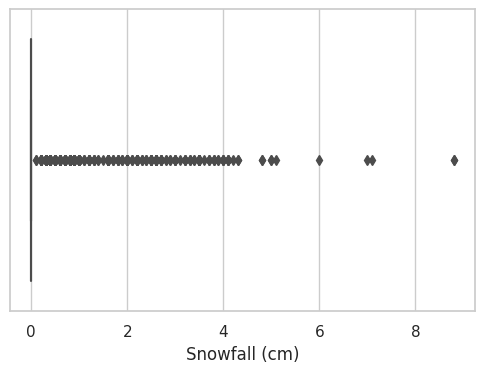

In [ ]:
ax=sns.boxplot(x=df["Snowfall (cm)"])	

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


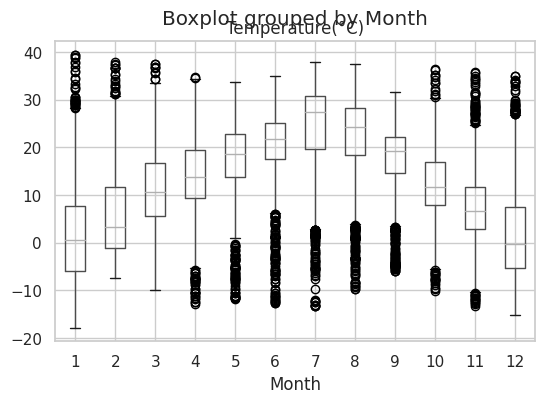

In [ ]:
df.boxplot(column='Temperature(°C)',by='Month')

it looklikes there is no outlier in this dataset


---



---

\

# **Normalising data**

In [ ]:
df.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


In [ ]:
numeric_features = df.describe().columns
numeric_features

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Month',
       'Year', 'day'],
      dtype='object')

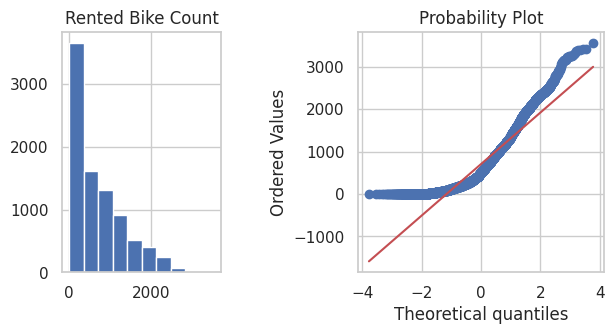

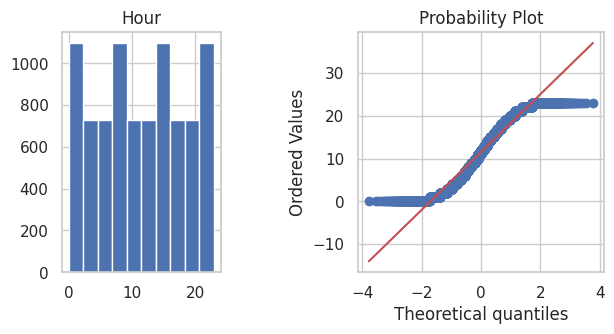

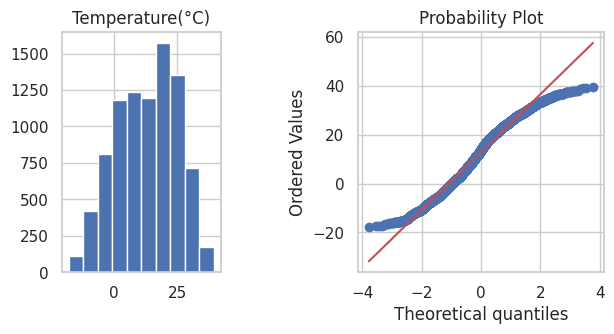

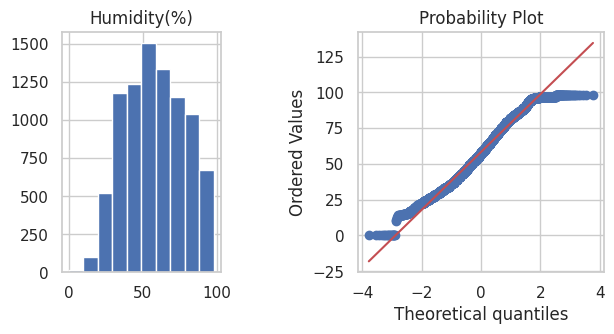

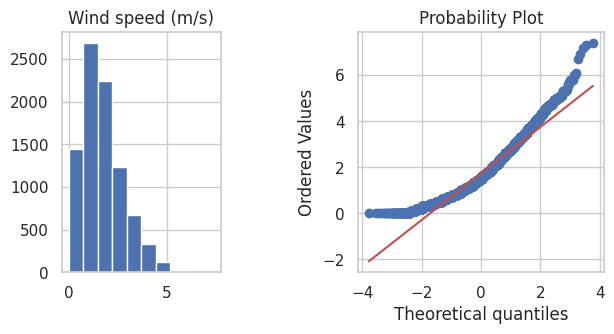

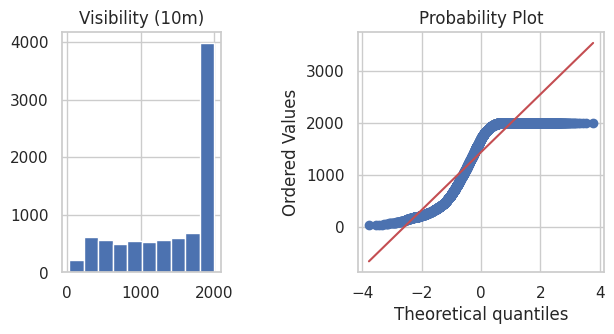

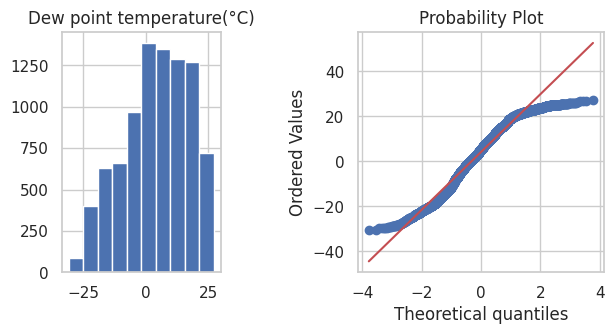

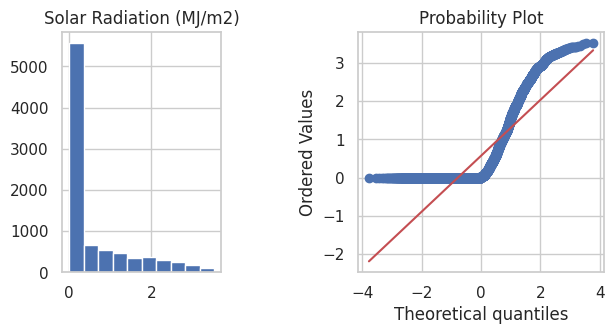

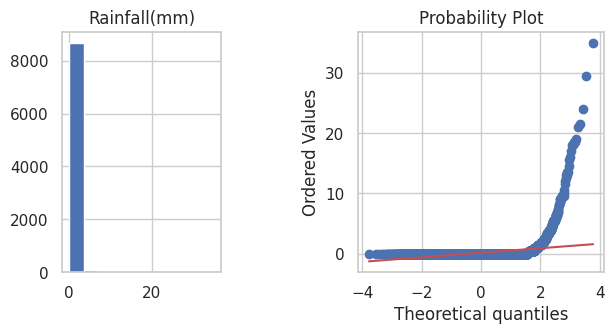

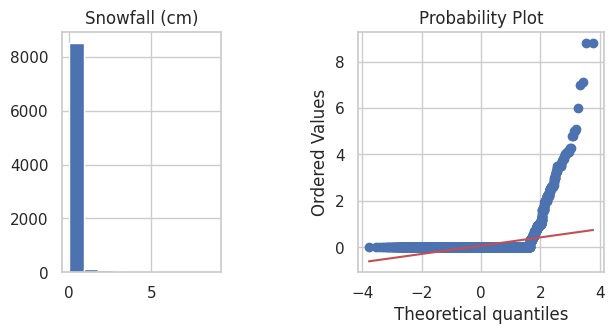

In [ ]:
# checking distribution and data is skewed or not
import scipy.stats as stats
import matplotlib.pyplot as plt


def plotvariable(df,variable):
  plt.figure(figsize=(7,7))
  plt.subplot(2,3,1)  #means in sub plot 2 row , 3 cloumns and first plot
  df[variable].hist(bins=10)
  plt.title(col)

   ## Q-Q plot
  plt.subplot(2,2,2)
  stats.probplot(df[variable],dist='norm',plot=plt)
  plt.show()

for col in numeric_features[0:10]:
  plotvariable(df,col)
  


# Log Transformation

In [ ]:
df_log=df.copy()

In [ ]:
df_log.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


In [ ]:
numeric_features_log = df_log.describe().columns
numeric_features_log

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Month',
       'Year', 'day'],
      dtype='object')

In [ ]:
for col in numeric_features_log:
  df_log[col]=df_log[col]+.01

In [ ]:
df_log.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254.01,0.01,-5.19,37.01,2.21,2000.01,-17.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
1,204.01,1.01,-5.49,38.01,0.81,2000.01,-17.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
2,173.01,2.01,-5.99,39.01,1.01,2000.01,-17.69,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
3,107.01,3.01,-6.19,40.01,0.91,2000.01,-17.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday
4,78.01,4.01,-5.99,36.01,2.31,2000.01,-18.59,0.01,0.01,0.01,Winter,No Holiday,Yes,1.01,2017.01,12.01,Thursday


In [ ]:
df_log.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Month,Year,day
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.612055,11.510000,12.892922,58.236256,1.734909,1436.835799,4.083813,0.579111,0.158687,0.085068,6.536027,2017.925068,15.730548
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,3.448048,0.278796,8.796749
min,0.010000,0.010000,-17.790000,0.010000,0.010000,27.010000,-30.590000,0.010000,0.010000,0.010000,1.010000,2017.010000,1.010000
25%,191.010000,5.760000,3.510000,42.010000,0.910000,940.010000,-4.690000,0.010000,0.010000,0.010000,4.010000,2018.010000,8.010000
50%,504.510000,11.510000,13.710000,57.010000,1.510000,1698.010000,5.110000,0.020000,0.010000,0.010000,7.010000,2018.010000,16.010000
75%,1065.260000,17.260000,22.510000,74.010000,2.310000,2000.010000,14.810000,0.940000,0.010000,0.010000,10.010000,2018.010000,23.010000
max,3556.010000,23.010000,39.410000,98.010000,7.410000,2000.010000,27.210000,3.530000,35.010000,8.810000,12.010000,2018.010000,31.010000


In [ ]:
df_log['Rented Bike Count'].describe()

count    8760.000000
mean      704.612055
std       644.997468
min         0.010000
25%       191.010000
50%       504.510000
75%      1065.260000
max      3556.010000
Name: Rented Bike Count, dtype: float64

In [ ]:

df_log['Rented Bike Count']=np.log(df_log['Rented Bike Count'])

In [ ]:
df_log.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Month,Year,day
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,5.727180,11.510000,12.892922,58.236256,1.734909,1436.835799,4.083813,0.579111,0.158687,0.085068,6.536027,2017.925068,15.730548
std,2.242278,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,3.448048,0.278796,8.796749
min,-4.605170,0.010000,-17.790000,0.010000,0.010000,27.010000,-30.590000,0.010000,0.010000,0.010000,1.010000,2017.010000,1.010000
25%,5.252326,5.760000,3.510000,42.010000,0.910000,940.010000,-4.690000,0.010000,0.010000,0.010000,4.010000,2018.010000,8.010000
50%,6.223587,11.510000,13.710000,57.010000,1.510000,1698.010000,5.110000,0.020000,0.010000,0.010000,7.010000,2018.010000,16.010000
75%,6.970974,17.260000,22.510000,74.010000,2.310000,2000.010000,14.810000,0.940000,0.010000,0.010000,10.010000,2018.010000,23.010000
max,8.176394,23.010000,39.410000,98.010000,7.410000,2000.010000,27.210000,3.530000,35.010000,8.810000,12.010000,2018.010000,31.010000


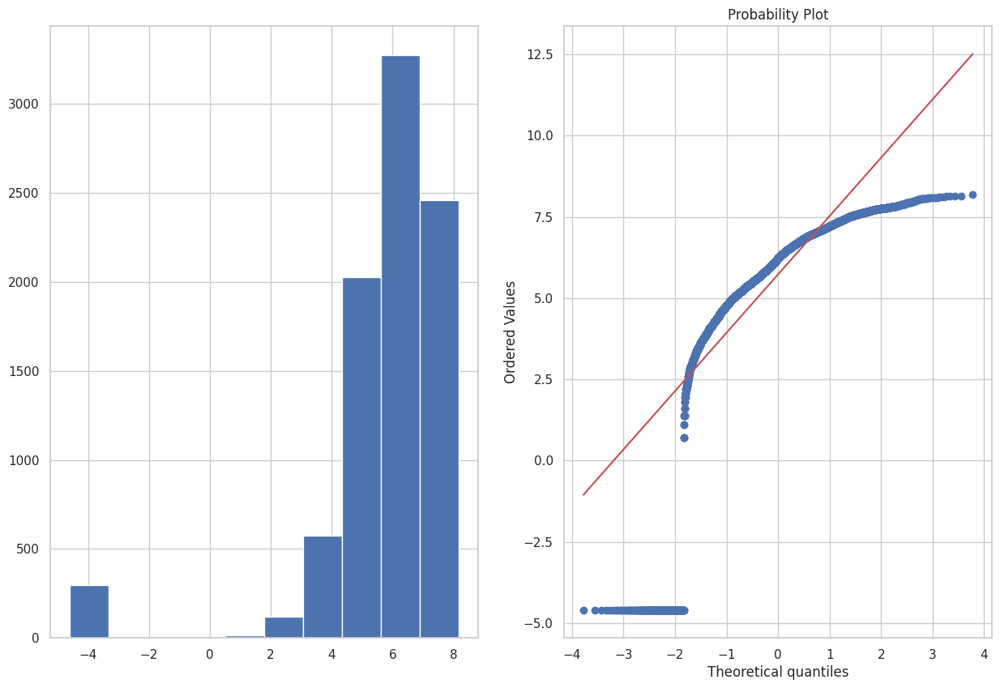

In [ ]:

import scipy.stats as stats
def plotlog(df, variable):
  plt.figure(figsize=(15,10))
  plt.subplot(1,2,1)  #means in sub plot 1 row , 2 cloumn and first plot
  df_log[variable].hist(bins=10)

  ## Q-Q plot
  plt.subplot(1,2,2)
  stats.probplot(df[variable],dist='norm',plot=plt)
  plt.show()


plotlog(df_log,'Rented Bike Count')
  

# Applying YEO-JOHANSON transformation

In [ ]:
df_yeo_johanson=df.copy()

In [ ]:
numeric_features_yeo_johanson = df_yeo_johanson.describe().columns
numeric_features_yeo_johanson

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Month',
       'Year', 'day'],
      dtype='object')

In [ ]:
for col in numeric_features_yeo_johanson:
  df_yeo_johanson[col]=df_yeo_johanson[col]+.01

In [ ]:
numeric_feature_df=df[['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']]
from sklearn.preprocessing import PowerTransformer
from pandas import DataFrame
power = PowerTransformer(method='yeo-johnson', standardize=True)
data_trans = power.fit_transform(numeric_feature_df)
data_trans=DataFrame(data_trans)

data_trans.rename(columns={0:'Rented Bike Count', 1:'Hour', 2:'Temperature(°C)',3: 'Humidity(%)',
       4:'Wind speed (m/s)', 5:'Visibility (10m)', 6:'Dew point temperature(°C)',
       7:'Solar Radiation (MJ/m2)', 8:'Rainfall(mm)', 9:'Snowfall (cm)'},inplace=True)
data_trans.head(2)



,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
0,-0.530004,-1.902967,-1.524521,-1.038829,0.618103,0.978214,-1.556854,-0.845761,-0.252859,-0.230785
1,-0.676497,-1.654871,-1.550870,-0.986482,-0.923651,0.978214,-1.556854,-0.845761,-0.252859,-0.230785


In [ ]:
data_trans.shape

(8760, 10)

In [ ]:
data_trans.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03
mean,-1.966790e-15,7.398952e-17,3.093162e-15,1.656425e-15,6.125744e-16,-2.143630e-15,-9.764640e-16,-9.245268e-16,-1.422910e-15,1.538711e-14
std,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00,1.000057e+00
min,-2.237130e+00,-1.902967e+00,-2.640013e+00,-3.323576e+00,-2.512538e+00,-1.906656e+00,-2.351050e+00,-8.457613e-01,-2.528588e-01,-2.307853e-01
25%,-7.183346e-01,-7.667177e-01,-7.748272e-01,-7.793079e-01,-7.782032e-01,-9.266806e-01,-7.314501e-01,-8.457613e-01,-2.528588e-01,-2.307853e-01
50%,8.901544e-03,8.758295e-02,7.641456e-02,-2.896424e-02,-4.175238e-02,3.768216e-01,1.364596e-04,-7.927406e-01,-2.528588e-01,-2.307853e-01
75%,7.639707e-01,8.360358e-01,8.040896e-01,7.823837e-01,7.001838e-01,9.782138e-01,8.289624e-01,1.115979e+00,-2.528588e-01,-2.307853e-01
max,2.485780e+00,1.521129e+00,2.192585e+00,1.876751e+00,3.174364e+00,9.782138e-01,1.935283e+00,1.699041e+00,4.021693e+00,4.337315e+00


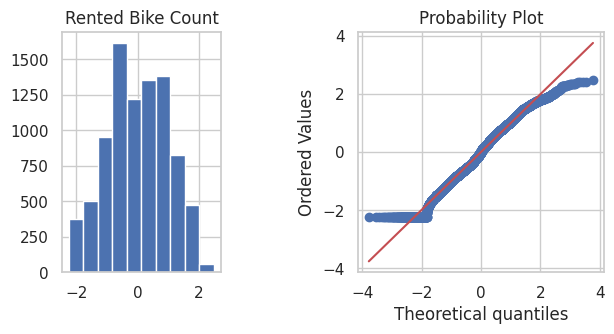

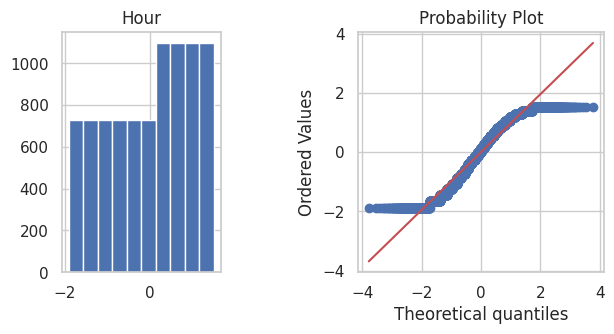

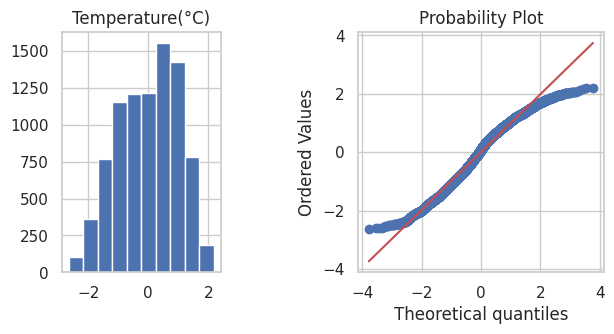

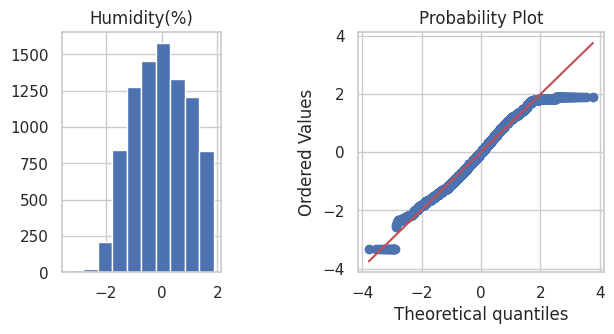

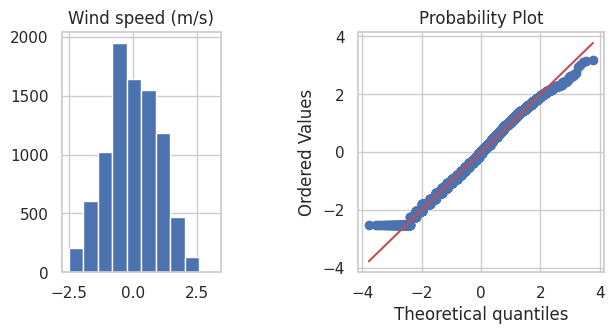

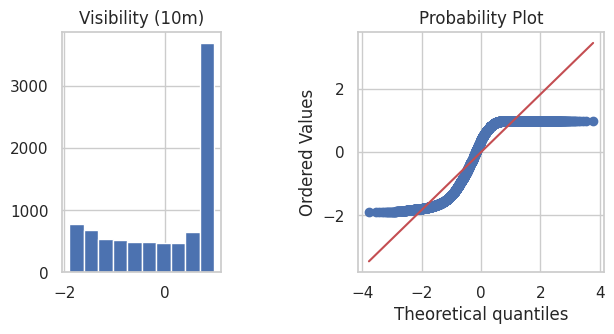

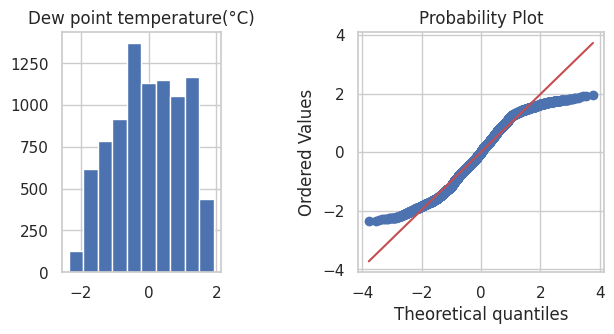

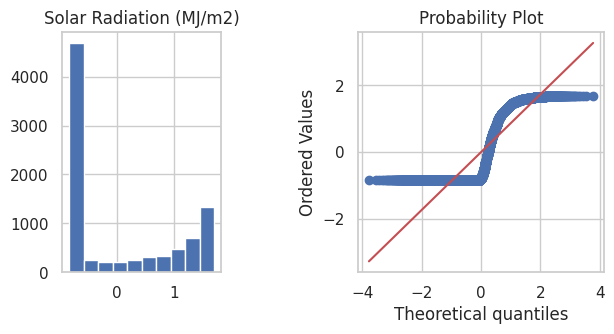

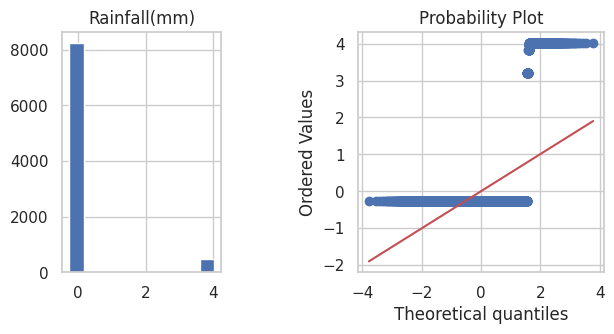

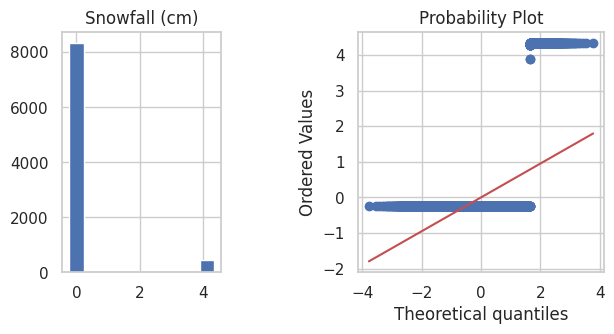

In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt


def plotvariable_box_cox(data_trans,variable):
  plt.figure(figsize=(7,7))
  plt.subplot(2,3,1)  #means in sub plot 2 row , 3 cloumns and first plot
  data_trans[variable].hist(bins=10)
  plt.title(col)

   ## Q-Q plot
  plt.subplot(2,2,2)
  stats.probplot(data_trans[variable],dist='norm',plot=plt)
  plt.show()

for col in data_trans[0:10]:
  plotvariable_box_cox(data_trans,col)
  

In [ ]:
df.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Year,day,day_of_week
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,1,2017,12,Thursday


In [ ]:
catagorical_df=df[['Seasons','day_of_week','Holiday','Functioning Day']]


df_yj = pd.concat([data_trans, catagorical_df], axis=1)
df_yj.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,day_of_week,Holiday,Functioning Day
0,-0.530004,-1.902967,-1.524521,-1.038829,0.618103,0.978214,-1.556854,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes
1,-0.676497,-1.654871,-1.550870,-0.986482,-0.923651,0.978214,-1.556854,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes
2,-0.779424,-1.440263,-1.594819,-0.934363,-0.640327,0.978214,-1.563069,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes
3,-1.047379,-1.244866,-1.612409,-0.882465,-0.778203,0.978214,-1.556854,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes
4,-1.200315,-1.062616,-1.594819,-1.091410,0.700184,0.978214,-1.618915,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes


# **Checking distribution with Dependent Variable**



---



---



---



---



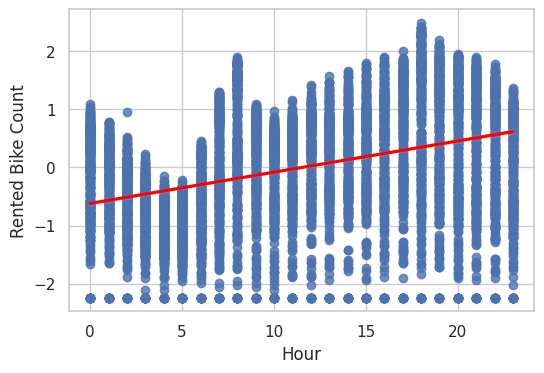

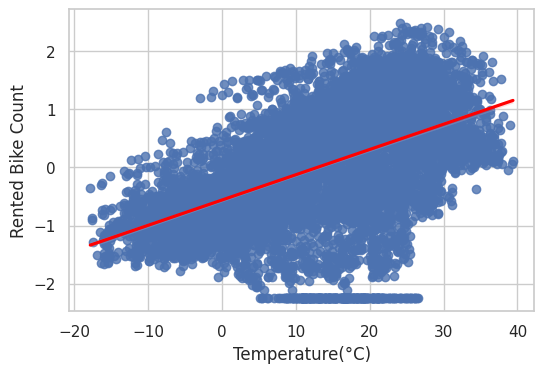

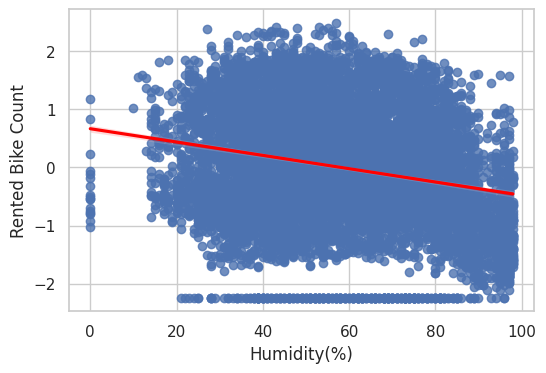

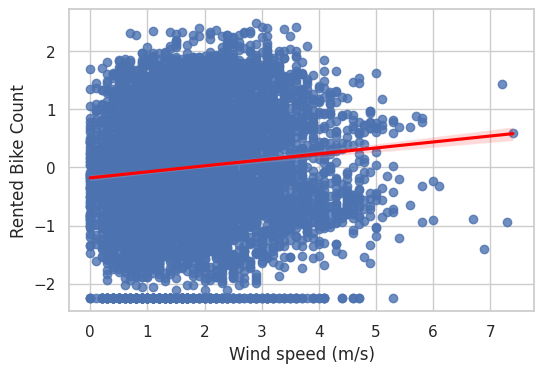

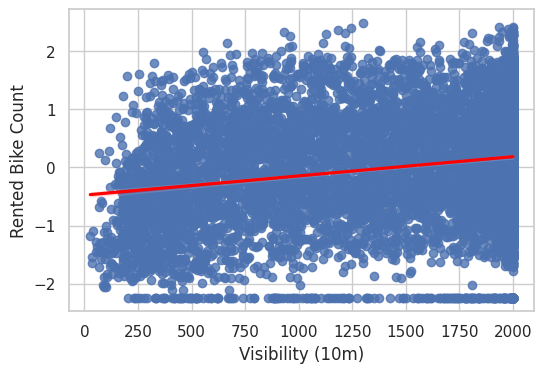

...

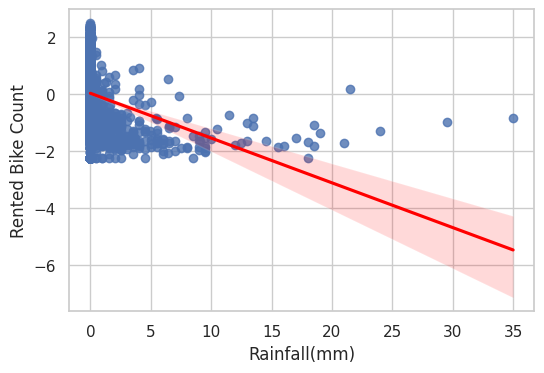

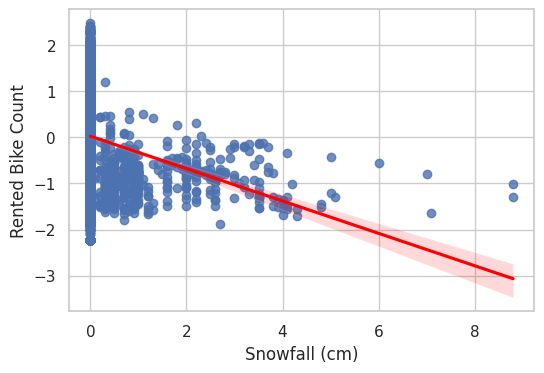

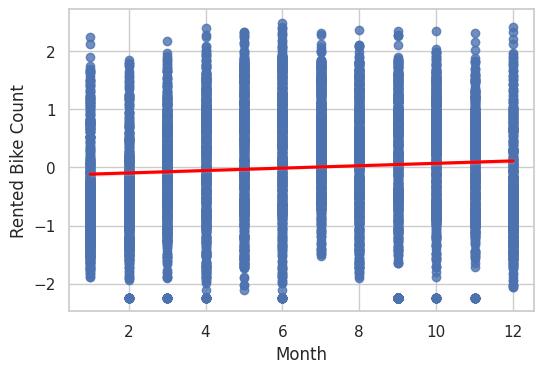

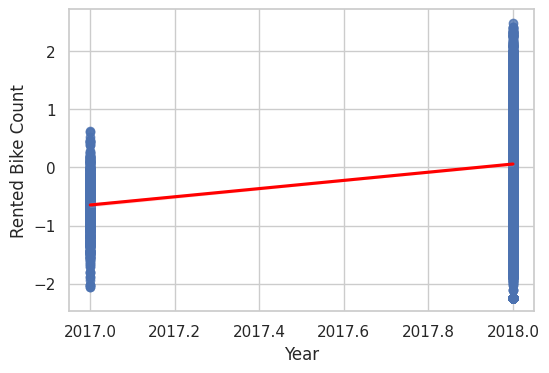

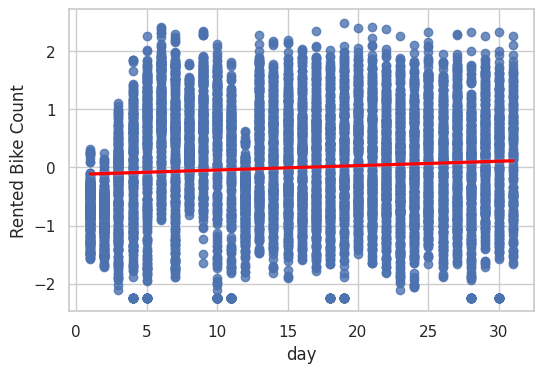

In [ ]:
for col in numeric_features[:]:
  if col == 'Rented Bike Count':
    pass
  else:
    sns.regplot(x=df[col],y=df_yj["Rented Bike Count"],line_kws={"color": "red"})
  
  plt.show()

# **Checking corelation of variable**

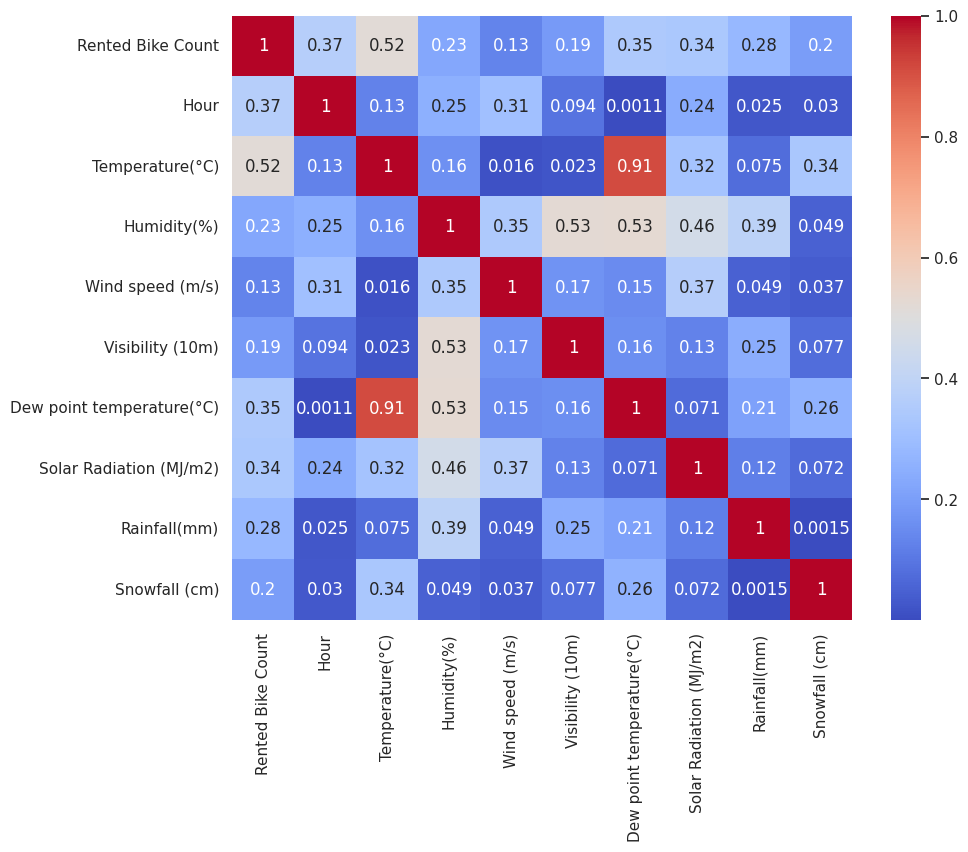

In [ ]:
plt.figure(figsize=(10,8))
correlation = df_yj.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
 
   # Calculating VIF
   vif = pd.DataFrame()
   vif["variables"] = X.columns
   vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
 
   return(vif)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
calc_vif(df_yj[[i for i in df_yj.describe().columns if i not in ['Rented Bike Count'] ]])

,variables,VIF
0,Hour,1.182670
1,Temperature(°C),46.026911
2,Humidity(%),12.034723
3,Wind speed (m/s),1.298162
4,Visibility (10m),1.564782
5,Dew point temperature(°C),60.387097
6,Solar Radiation (MJ/m2),1.858436
7,Rainfall(mm),1.198914
8,Snowfall (cm),1.168005


In [ ]:
df_without_dewpoint=df_yj.drop(['Dew point temperature(°C)'],axis=1)

In [ ]:
df_without_dewpoint.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,day_of_week,Holiday,Functioning Day
0,-0.530004,-1.902967,-1.524521,-1.038829,0.618103,0.978214,-0.845761,-0.252859,-0.230785,Winter,Thursday,No Holiday,Yes


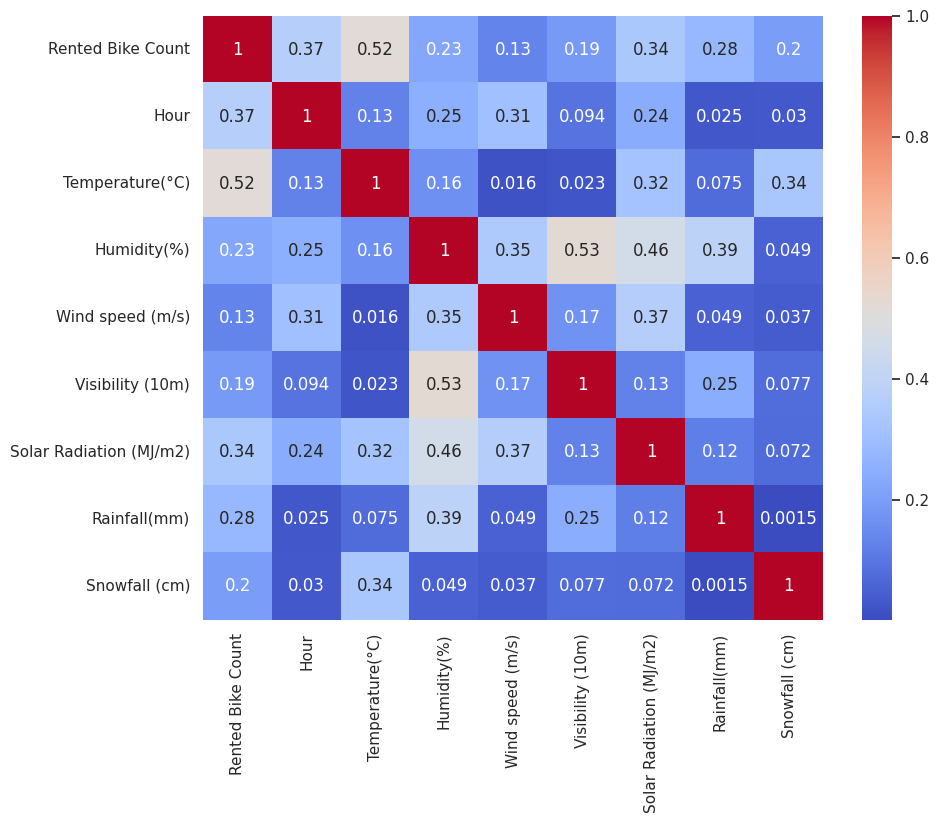

In [ ]:
plt.figure(figsize=(10,8))
correlation = df_without_dewpoint.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

In [ ]:
calc_vif(df_yj[[i for i in df_without_dewpoint.describe().columns if i not in ['Rented Bike Count'] ]])

,variables,VIF
0,Hour,1.180457
1,Temperature(°C),1.602807
2,Humidity(%),2.523959
3,Wind speed (m/s),1.297669
4,Visibility (10m),1.502836
5,Solar Radiation (MJ/m2),1.827327
6,Rainfall(mm),1.198674
7,Snowfall (cm),1.163389


# **One hot encoding for catogorical variable**

In [ ]:
#One hot encoding